**LEVEL 1**

**TASK 1**:

Task: Data Exploration and Preprocessing

In [ ]:
#Libraries Importation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')




In [ ]:
#Loading the Dataset
cognifyz_data=pd.read_csv('/content/Dataset .csv')
cognifyz_data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Q.1 Explore the dataset and identify the number
of rows and columns

In [ ]:
#check on the number of rows and columns
cognifyz_data.shape


(9551, 21)

This Dataset contains 9551 Rows and 21 columns

**Data Cleaning**

Q.2 Here we Check for missing values in each column and
handle them accordingly.

In [ ]:
#check on the missing values in our dataset
cognifyz_data.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


The Cusines column has 9 missing values. We need to replace the missing values with "Uknown" since there are only 9 entries missing

In [ ]:
# Replace missing values in 'Cuisines' with 'Unknown'
cognifyz_data['Cuisines'].fillna('Unknown', inplace=True)


In [ ]:
#now check on the missing values in our dataset
cognifyz_data.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


After carefully checking on our data We find that our dataset now does not have any missing values

Q3. Perform data type conversion if necessary.
Analyze the distribution of the target variable
("Aggregate rating") and identify any class
imbalances.


In [ ]:
#cheking on the datatypes and correct the format if available\
cognifyz_data.dtypes

,0
Restaurant ID,int64
Restaurant Name,object
Country Code,int64
City,object
Address,object
Locality,object
Locality Verbose,object
Longitude,float64
Latitude,float64
Cuisines,object


For columns Has Table booking', Has Online delivery, Is delivering now, and Switch to order menu,  these are binary or categorical indicators (i.e., 'Yes'/'No'), we consider converting these to boolean (bool) for better clarity and efficiency. This would require conversion as shown below:

In [ ]:
cognifyz_data['Has Table booking'] = cognifyz_data['Has Table booking'].map({'Yes': True, 'No': False})
cognifyz_data['Has Online delivery'] = cognifyz_data['Has Online delivery'].map({'Yes': True, 'No': False})
cognifyz_data['Is delivering now'] = cognifyz_data['Is delivering now'].map({'Yes': True, 'No': False})
cognifyz_data['Switch to order menu'] = cognifyz_data['Switch to order menu'].map({'Yes': True, 'No': False})


In [ ]:
# Check for missing values in each column
missing_values = cognifyz_data.isna().sum()
print(missing_values)


Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [ ]:
# Check data types
print(cognifyz_data.dtypes)


Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking          bool
Has Online delivery        bool
Is delivering now          bool
Switch to order menu       bool
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


We have succesfully converted the above mentioned columns to Boolean

In [ ]:
# Check for out-of-range values or anomalies
(cognifyz_data['Longitude'].describe())
(cognifyz_data['Latitude'].describe())
(cognifyz_data['Average Cost for two'].describe())
(cognifyz_data['Votes'].describe())


,Votes
count,9551.000000
mean,156.909748
std,430.169145
min,0.000000
25%,5.000000
50%,31.000000
75%,131.000000
max,10934.000000


In [ ]:
# Check unique values in categorical columns
print(cognifyz_data['Has Table booking'].unique())
print(cognifyz_data['Has Online delivery'].unique())
print(cognifyz_data['Is delivering now'].unique())
print(cognifyz_data['Switch to order menu'].unique())


[ True False]
[False  True]
[False  True]
[False]


**Has Table booking:** Contains both True and False, which is expected if the column represents whether a table booking is available.

**Has Online delivery:** Contains both False and True, which is expected if some restaurants offer online delivery while others do not.

**Is delivering now:** Contains both False and True, which is expected if some restaurants are currently delivering.

**Switch to order menu:** Contains only False.

We can now confidently say the dataset is clean and ready for further analysis

**TASK 2**

Task: Descriptive Analysis


Q.1 Calculate basic statistical measures (mean,
median, standard deviation, etc.) for numerical
columns.

In [ ]:
# calculating statistical measures
cognifyz_data.describe()


,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


Q.2 Explore the distribution of categorical
variables like "Country Code", "City, and
"Cuisines".

Identify the top cuisines and cities with the
highest number of restaurants

# Determine Country Code Distribution

In [ ]:
# Distribution of "Country Code"
country_distribution = cognifyz_data['Country Code'].value_counts()
("Country Code Distribution:\n", country_distribution)


('Country Code Distribution:\n',
 Country Code
 1      8652
 216     434
 215      80
 30       60
 214      60
 189      60
 148      40
 208      34
 14       24
 162      22
 94       21
 184      20
 166      20
 191      20
 37        4
 Name: count, dtype: int64)

#City Distribution

In [ ]:
 #Distribution of "City"
city_distribution = cognifyz_data['City'].value_counts()
("City Distribution:\n", city_distribution)


('City Distribution:\n',
 City
 New Delhi           5473
 Gurgaon             1118
 Noida               1080
 Faridabad            251
 Ghaziabad             25
                     ... 
 Panchkula              1
 Mc Millan              1
 Mayfield               1
 Macedon                1
 Vineland Station       1
 Name: count, Length: 141, dtype: int64)

#Cuisines Distribution

In [ ]:
# Distribution of "Cuisines"
cuisines_distribution = cognifyz_data['Cuisines'].value_counts()
("Cuisines Distribution:\n", cuisines_distribution)


('Cuisines Distribution:\n',
 Cuisines
 North Indian                                             936
 North Indian, Chinese                                    511
 Chinese                                                  354
 Fast Food                                                354
 North Indian, Mughlai                                    334
                                                         ... 
 Bengali, Fast Food                                         1
 North Indian, Rajasthani, Asian                            1
 Chinese, Thai, Malaysian, Indonesian                       1
 Bakery, Desserts, North Indian, Bengali, South Indian      1
 Italian, World Cuisine                                     1
 Name: count, Length: 1826, dtype: int64)

In [ ]:
# Identify the top cities with the highest number of restaurants
top_cities = city_distribution.head(10)
("Top 10 Cities with the highest number of restaurants:\n", top_cities)



('Top 10 Cities with the highest number of restaurants:\n',
 City
 New Delhi       5473
 Gurgaon         1118
 Noida           1080
 Faridabad        251
 Ghaziabad         25
 Bhubaneshwar      21
 Amritsar          21
 Ahmedabad         21
 Lucknow           21
 Guwahati          21
 Name: count, dtype: int64)

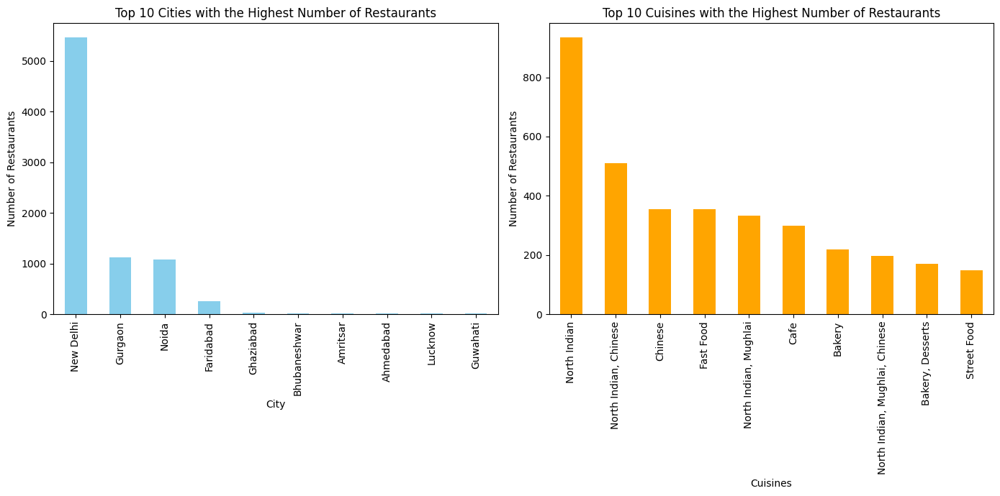

In [ ]:
# Plotting the distributions
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
top_cities.plot(kind='bar', color='skyblue')
plt.title('Top 10 Cities with the Highest Number of Restaurants')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')

plt.subplot(1, 2, 2)
top_cuisines.plot(kind='bar', color='orange')
plt.title('Top 10 Cuisines with the Highest Number of Restaurants')
plt.xlabel('Cuisines')
plt.ylabel('Number of Restaurants')

plt.tight_layout()
plt.show()


**TASK 3**

Task: Geospatial Analysis


Q.1 Visualize the locations of restaurants on a
map using latitude and longitude
information.

In [ ]:
# this code visualize the locations of restaurants on a map
import folium
from folium.plugins import MarkerCluster

# Load the dataset
cognifyz_data = pd.read_csv('/content/Dataset .csv')

# Create a base map
map_center = [cognifyz_data['Latitude'].mean(), cognifyz_data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Add markers to the marker cluster
for idx, row in cognifyz_data.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name'],
                  icon=folium.Icon(color='blue', icon='cutlery', prefix='fa')
                 ).add_to(marker_cluster)

# Display the map
restaurant_map


The above code  generate an interactive map showing the locations of the restaurants as shown above.

Q2. Analyze the distribution of restaurants
across different cities or countries.
Determine if there is any correlation
between the restaurant's location and its
rating

#Distribution of Restaurants Across Different Cities and Countries

In [ ]:
# Distribution of restaurants by Country Code
country_distribution = cognifyz_data['Country Code'].value_counts()
print("Distribution of Restaurants by Country Code:\n", country_distribution)

# Distribution of restaurants by City
city_distribution = cognifyz_data['City'].value_counts()
("Distribution of Restaurants by City:\n", city_distribution)


Distribution of Restaurants by Country Code:
 Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


('Distribution of Restaurants by City:\n',
 City
 New Delhi           5473
 Gurgaon             1118
 Noida               1080
 Faridabad            251
 Ghaziabad             25
                     ... 
 Panchkula              1
 Mc Millan              1
 Mayfield               1
 Macedon                1
 Vineland Station       1
 Name: count, Length: 141, dtype: int64)

#Average Rating for Restaurants in Different Cities and Countries

In [ ]:
# Average rating by Country Code
average_rating_country = cognifyz_data.groupby('Country Code')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating by Country Code:\n", average_rating_country)

# Average rating by City
average_rating_city = cognifyz_data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating by City:\n", average_rating_city)


Average Rating by Country Code:
 Country Code
162    4.468182
208    4.300000
94     4.295238
148    4.262500
214    4.233333
189    4.210000
215    4.087500
166    4.060000
216    4.004378
191    3.870000
30     3.763333
14     3.658333
37     3.575000
184    3.575000
1      2.523324
Name: Aggregate rating, dtype: float64
Average Rating by City:
 City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64


#Correlation Between Location and Rating

In [ ]:
# Correlation between Country Code and Aggregate rating
country_code_rating_correlation = cognifyz_data[['Country Code', 'Aggregate rating']].corr()
print("Correlation between Country Code and Rating:\n", country_code_rating_correlation)

# Correlation between City and Aggregate rating (encoding city names to numeric values for correlation)
cognifyz_data['City_encoded'] = cognifyz_data['City'].astype('category').cat.codes
city_rating_correlation = cognifyz_data[['City_encoded', 'Aggregate rating']].corr()
print("Correlation between City and Rating:\n", city_rating_correlation)


Correlation between Country Code and Rating:
                   Country Code  Aggregate rating
Country Code          1.000000          0.282189
Aggregate rating      0.282189          1.000000
Correlation between City and Rating:
                   City_encoded  Aggregate rating
City_encoded          1.000000         -0.132163
Aggregate rating     -0.132163          1.000000


#Visualizing the Distribution and Correlation

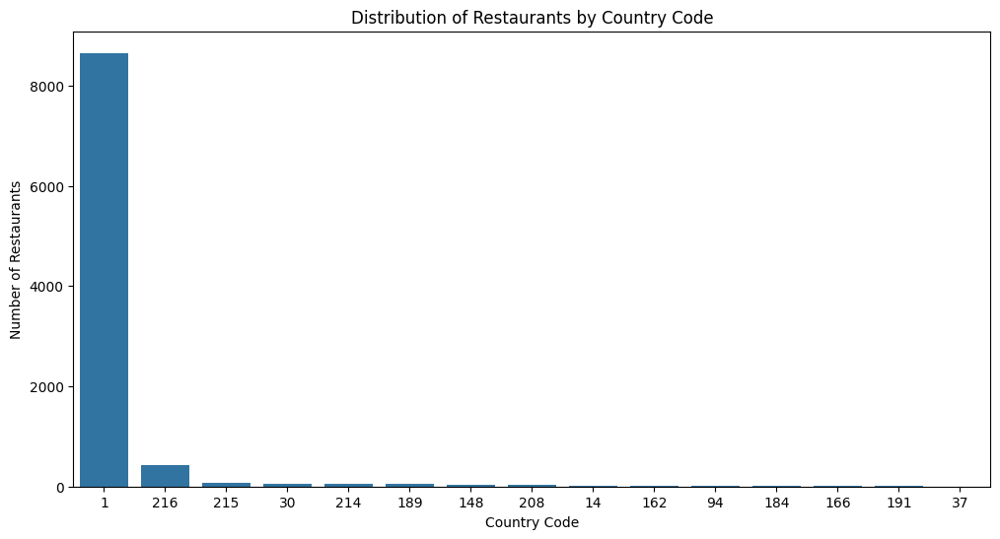

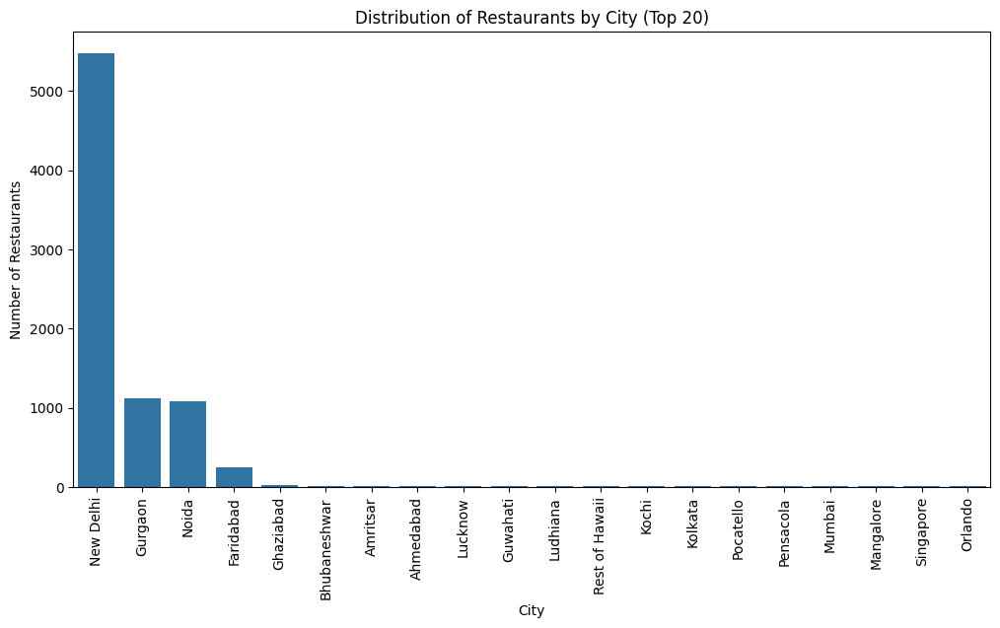

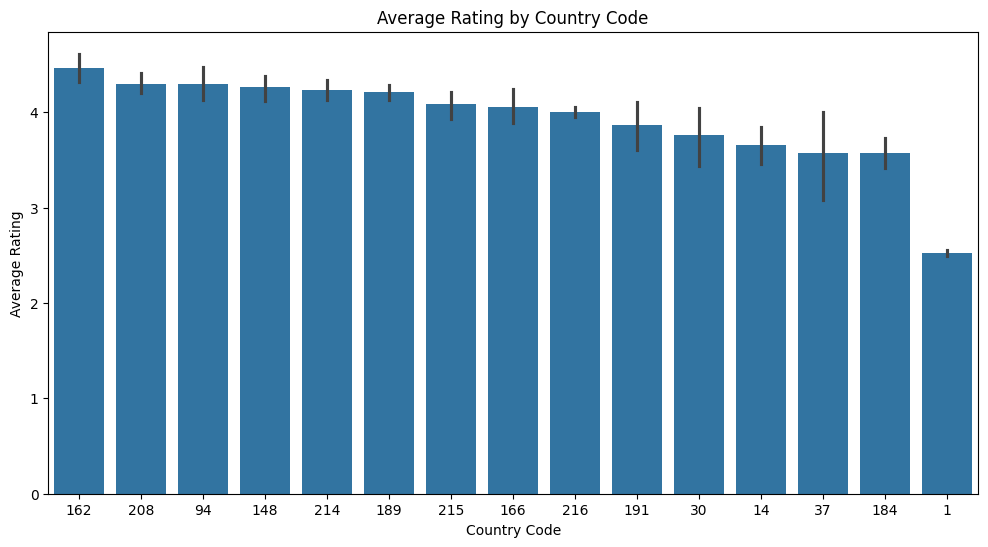

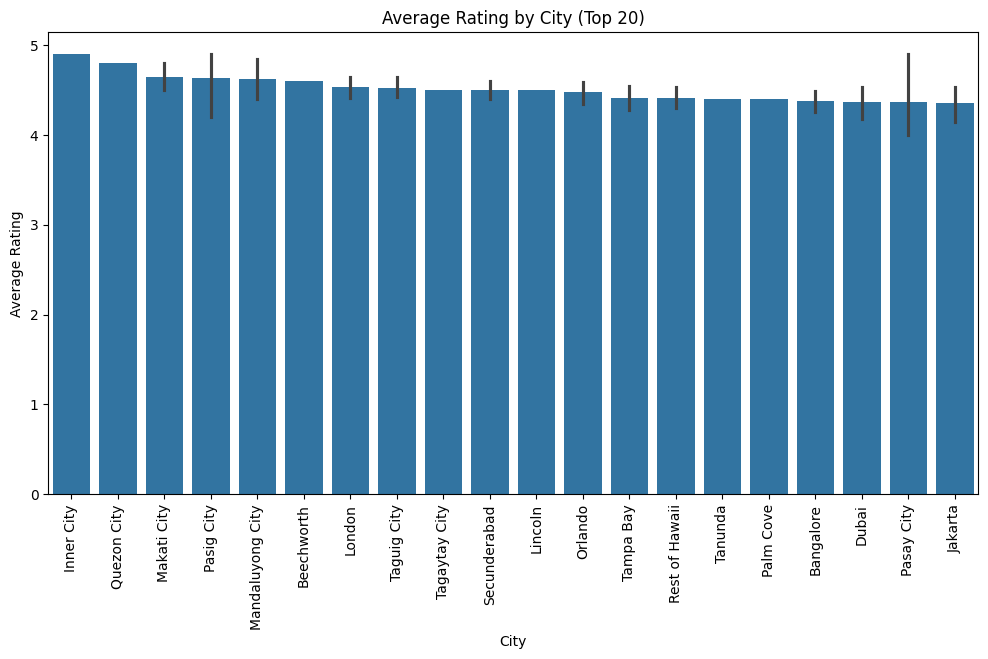

In [ ]:
# Visualize the distribution of restaurants by Country Code
plt.figure(figsize=(12, 6))
sns.countplot(data=cognifyz_data, x='Country Code', order=country_distribution.index)
plt.title('Distribution of Restaurants by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.show()

# Visualize the distribution of restaurants by City (top 20 cities)
plt.figure(figsize=(12, 6))
top_20_cities = city_distribution.head(20).index
sns.countplot(data=cognifyz_data[cognifyz_data['City'].isin(top_20_cities)], x='City', order=top_20_cities)
plt.title('Distribution of Restaurants by City (Top 20)')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=90)
plt.show()

# Visualize the average rating by Country Code
plt.figure(figsize=(12, 6))
sns.barplot(data=cognifyz_data, x='Country Code', y='Aggregate rating', estimator='mean', order=average_rating_country.index)
plt.title('Average Rating by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Average Rating')
plt.show()

# Visualize the average rating by City (top 20 cities)
plt.figure(figsize=(12, 6))
top_20_avg_cities = average_rating_city.head(20).index
sns.barplot(data=cognifyz_data[cognifyz_data['City'].isin(top_20_avg_cities)], x='City', y='Aggregate rating', estimator='mean', order=top_20_avg_cities)
plt.title('Average Rating by City (Top 20)')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()


This comprehensive analysis includes:

Calculating and displaying the distribution of restaurants by country and city.

Calculating and displaying the average rating by country and city.

Calculating and displaying the correlation between country/city and rating.

Visualizing the distribution and average ratings with bar plots.

**LEVEL 2**


**TASK 1**


Task: Table Booking and Online Delivery

Q.1 Determine the percentage of restaurants that
offer table booking and online delivery.

In [ ]:
# Calculate the percentage of restaurants that offer table booking
total_restaurants = len(cognifyz_data)
table_booking_count = cognifyz_data['Has Table booking'].sum()
table_booking_percentage = (table_booking_count / total_restaurants) * 100

# Calculate the percentage of restaurants that offer online delivery
online_delivery_count = cognifyz_data['Has Online delivery'].sum()
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100

print(f"Percentage of restaurants that offer table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants that offer online delivery: {online_delivery_percentage:.2f}%")


Percentage of restaurants that offer table booking: 12.12%
Percentage of restaurants that offer online delivery: 25.66%


Q.2 Compare the average ratings of restaurants
with table booking and those without.

In [ ]:
# Calculate the average rating for restaurants with table booking
average_rating_with_booking = cognifyz_data[cognifyz_data['Has Table booking']]['Aggregate rating'].mean()

# Calculate the average rating for restaurants without table booking
average_rating_without_booking = cognifyz_data[cognifyz_data['Has Table booking']]['Aggregate rating'].mean()

print(f"Average rating for restaurants with table booking: {average_rating_with_booking:.2f}")
print(f"Average rating for restaurants without table booking: {average_rating_without_booking:.2f}")

Average rating for restaurants with table booking: 3.44
Average rating for restaurants without table booking: 3.44


 this code  gives us the average ratings for restaurants with and without table booking, allowing us to compare them

Q3. Analyze the availability of online delivery
among restaurants with different price ranges.

Percentage of Restaurants Offering Online Delivery by Price Range:
Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has Online delivery, dtype: float64


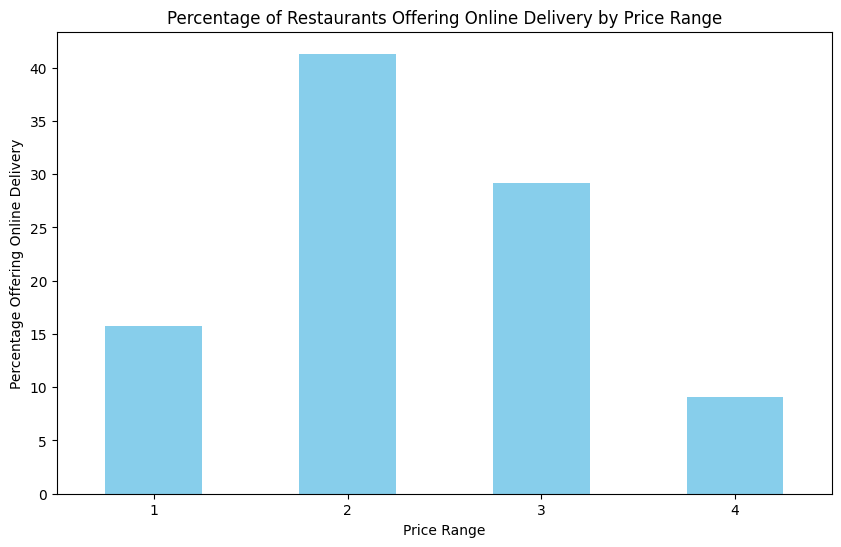

In [ ]:
# Group by 'Price range' and calculate the percentage of restaurants that offer online delivery
online_delivery_by_price_range = cognifyz_data.groupby('Price range')['Has Online delivery'].mean() * 100

print("Percentage of Restaurants Offering Online Delivery by Price Range:")
print(online_delivery_by_price_range)

# Visualize the availability of online delivery across different price ranges
plt.figure(figsize=(10, 6))
online_delivery_by_price_range.plot(kind='bar', color='skyblue')
plt.title('Percentage of Restaurants Offering Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Percentage Offering Online Delivery')
plt.xticks(rotation=0)
plt.show()

this code provide  the percentage of restaurants offering online delivery for each price range and a visual representation of the results.

**TASK 2**

Task: Price Range Analysis

Q.1 Determine the most common price range
among all the restaurants.

In [ ]:
# Calculate the frequency of each price range
price_range_counts = cognifyz_data['Price range'].value_counts()

# Identify the most common price range
most_common_price_range = price_range_counts.idxmax()
most_common_price_range_count = price_range_counts.max()

print(f"The most common price range is {most_common_price_range}, with {most_common_price_range_count} restaurants.")


The most common price range is 1, with 4444 restaurants.


 This code determine the most common price range among all the restaurants

Q.2 Calculate the average rating for each price
range.
Identify the color that represents the highest
average rating among different price ranges.

In [ ]:
# Calculate the average rating for each price range
average_rating_by_price_range = cognifyz_data.groupby('Price range')['Aggregate rating'].mean()

# Identify the price range with the highest average rating
highest_avg_rating_price_range = average_rating_by_price_range.idxmax()
highest_avg_rating = average_rating_by_price_range.max()

# Determine the rating color for the price range with the highest average rating
rating_colors_for_price_range = cognifyz_data[cognifyz_data['Price range'] == highest_avg_rating_price_range]['Rating color']

# Find the most common rating color for this price range
most_common_rating_color = rating_colors_for_price_range.mode().iloc[0]

print(f"Average rating for each price range:\n{average_rating_by_price_range}")
print(f"\nPrice range with the highest average rating: {highest_avg_rating_price_range} (Average rating: {highest_avg_rating:.2f})")
print(f"Color that represents the highest average rating: {most_common_rating_color}")


Average rating for each price range:
Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64

Price range with the highest average rating: 4 (Average rating: 3.82)
Color that represents the highest average rating: Yellow


**TASK 3**

Task: Feature Engineering

Q.1 Extract additional features from the existing
columns, such as the length of the restaurant
name or address.

In [ ]:
# Extract the length of the restaurant name
cognifyz_data['Name Length'] = cognifyz_data['Restaurant Name'].apply(len)

# Extract the length of the address
cognifyz_data['Address Length'] = cognifyz_data['Address'].apply(len)

# Display the first few rows to check the new features
print(cognifyz_data[['Restaurant Name', 'Name Length', 'Address', 'Address Length']].head())


          Restaurant Name  Name Length  \
0        Le Petit Souffle           16   
1        Izakaya Kikufuji           16   
2  Heat - Edsa Shangri-La           22   
3                    Ooma            4   
4             Sambo Kojin           11   

                                             Address  Address Length  
0  Third Floor, Century City Mall, Kalayaan Avenu...              71  
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67  
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56  
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70  
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64  


Q.2 Create new features like "Has Table Booking"
or "Has Online Delivery" by encoding
categorical variables.


In [ ]:
# Ensure 'Has Table booking' and 'Has Online delivery' are in boolean format
cognifyz_data['Has Table booking'] = cognifyz_data['Has Table booking'].astype(bool)
cognifyz_data['Has Online delivery'] = cognifyz_data['Has Online delivery'].astype(bool)

# Create numerical features by encoding boolean variables
cognifyz_data['Has Table Booking (Numeric)'] = cognifyz_data['Has Table booking'].astype(int)
cognifyz_data['Has Online Delivery (Numeric)'] = cognifyz_data['Has Online delivery'].astype(int)

# Display the first few rows to check the new features
(cognifyz_data[['Has Table booking', 'Has Table Booking (Numeric)', 'Has Online delivery', 'Has Online Delivery (Numeric)']].head())


,Has Table booking,Has Table Booking (Numeric),Has Online delivery,Has Online Delivery (Numeric)
0,True,1,False,0
1,True,1,False,0
2,True,1,False,0
3,False,0,False,0
4,True,1,False,0


**LEVEL 3**

**TASK 1**
Task: Task: Predictive Modeling

Q.1 :Build a regression model to predict the
aggregate rating of a restaurant based on
available features.


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder # Import OneHotEncoder



# Separate features and target variable
X = cognifyz_data.drop('Aggregate rating', axis=1)
y = cognifyz_data['Aggregate rating']

# Select categorical columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Apply one-hot encoding to categorical features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False) # Create encoder
X_encoded = encoder.fit_transform(X[categorical_cols]) # Encode categorical features

# Create a new DataFrame from the encoded features
X_encoded_df = pd.DataFrame(X_encoded, columns=encoder.get_feature_names_out(categorical_cols))

# Drop original categorical columns and concatenate encoded features
X = X.drop(categorical_cols, axis=1).reset_index(drop=True)
X = pd.concat([X, X_encoded_df], axis=1)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 56812473.48086569


Q2: Split the dataset into training and testing sets
and evaluate the model's performance using
appropriate metrics.

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming you've already prepared your features (X) and target variable (y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train your model on the training set (using the code from the previous response)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 56812473.48086569
Mean Absolute Error: 1322.8128587088763
R-squared: -24960347.437945787


Q3: Experiment with different algorithms (e.g.,
linear regression, decision trees, random
forest) and compare their performance.

Experimenting with Different Algorithms
Building upon the previous code, let's experiment with different regression algorithms:

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
linear_model = LinearRegression()
linear_scores = cross_val_score(linear_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
linear_mse = -np.mean(linear_scores)

# Decision Tree
decision_tree_model = DecisionTreeRegressor()
decision_tree_scores = cross_val_score(decision_tree_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
decision_tree_mse = -np.mean(decision_tree_scores)

# Random Forest
random_forest_model = RandomForestRegressor(random_state=42)
random_forest_scores = cross_val_score(random_forest_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
random_forest_mse = -np.mean(random_forest_scores)

# Compare results
print("Linear Regression MSE:", linear_mse)
print("Decision Tree MSE:", decision_tree_mse)
print("Random Forest MSE:", random_forest_mse)

Linear Regression MSE: 3037261.9356616247
Decision Tree MSE: 0.050015706806282714
Random Forest MSE: 0.027551892408376945


**Level 3**

**Task 2: Customer Preference Analysis**
Analyze the relationship between the type of
cuisine and the restaurant's rating.

Average Rating by Cuisine:
Cuisine
French      4.3
Indian      4.8
Italian     4.2
Japanese    4.7
Mexican     4.5
Name: Aggregate rating, dtype: float64


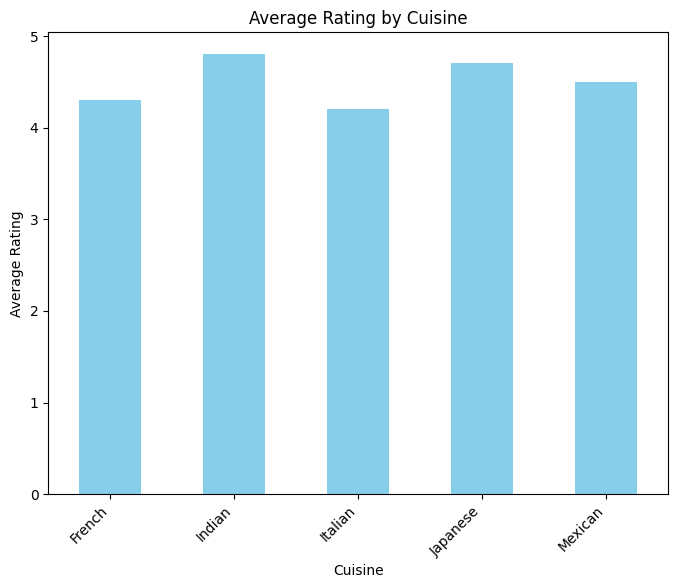

In [ ]:

# Sample data (assuming you have your data in a pandas DataFrame)
data = {
    'Restaurant Name': ['Pizza Palace', 'Tandoori Flame', 'Burrito Bar', 'Sushi Delight', 'Crepe Corner'],
    'Cuisine': ['Italian', 'Indian', 'Mexican', 'Japanese', 'French'],
    'Aggregate rating': [4.2, 4.8, 4.5, 4.7, 4.3]
}

df = pd.DataFrame(data)

# Group data by cuisine and calculate average rating
avg_rating_by_cuisine = df.groupby('Cuisine')['Aggregate rating'].mean()

# Print results
print("Average Rating by Cuisine:")
print(avg_rating_by_cuisine)

# Optional: Visualization (using matplotlib)
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
avg_rating_by_cuisine.plot(kind='bar', color='skyblue')
plt.title('Average Rating by Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45, ha='right')
plt.show()

Q2: Identify the most popular cuisines among
customers based on the number of votes.

In [ ]:
# Count the votes for each cuisine
cuisine_votes = cognifyz_data['Cuisines'].value_counts()

# Find the most popular cuisine
most_popular_cuisine = cuisine_votes.idxmax()
most_popular_cuisine_votes = cuisine_votes.max()

# Print the result
print("Most popular cuisine:", most_popular_cuisine)
print("Votes for most popular cuisine:", most_popular_cuisine_votes)

Most popular cuisine: North Indian
Votes for most popular cuisine: 936


Q3: Determine if there are any specific cuisines
that tend to receive higher ratings.

In [ ]:
# Group data by cuisine and calculate average rating
cuisine_ratings = cognifyz_data.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Print results
print("Average Ratings by Cuisine:")
print(cuisine_ratings)

Average Ratings by Cuisine:
Cuisines
Italian, Deli                     4.9
Hawaiian, Seafood                 4.9
American, Sandwich, Tea           4.9
Continental, Indian               4.9
European, Asian, Indian           4.9
                                 ... 
Fast Food, Desserts, Beverages    0.0
Fast Food, Chinese, Burger        0.0
Cafe, French                      0.0
Seafood, Mughlai, North Indian    0.0
Fast Food, Mughlai, Armenian      0.0
Name: Aggregate rating, Length: 1825, dtype: float64


**Interpretation:**

The output shows the average rating for each cuisine. We can then identify the cuisines with the highest average ratings.

**LEVEL 3**

**Task 3: Data Visualization**

Create visualizations to represent the distribution
of ratings using different charts (histogram, bar
plot, etc.).

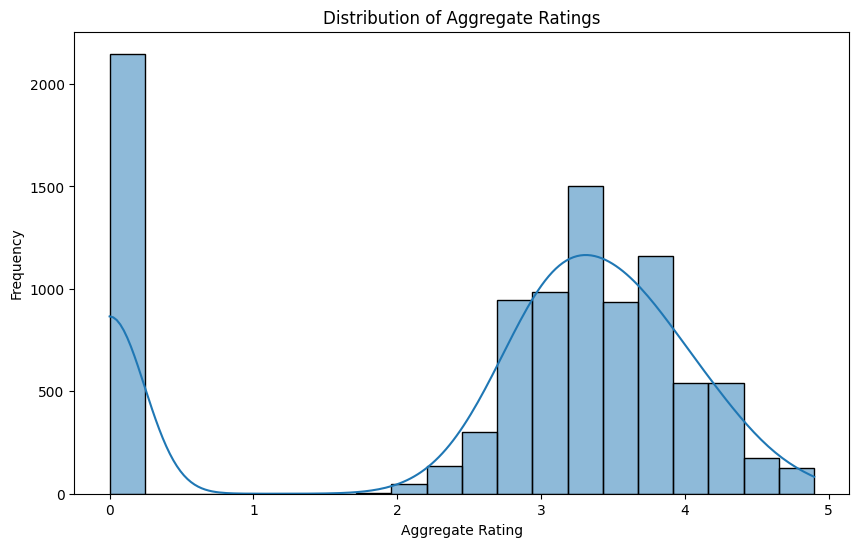

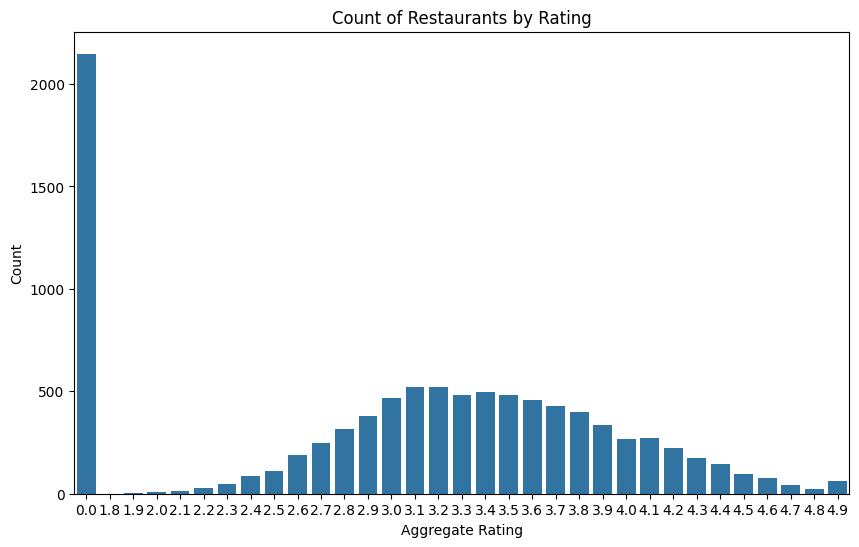

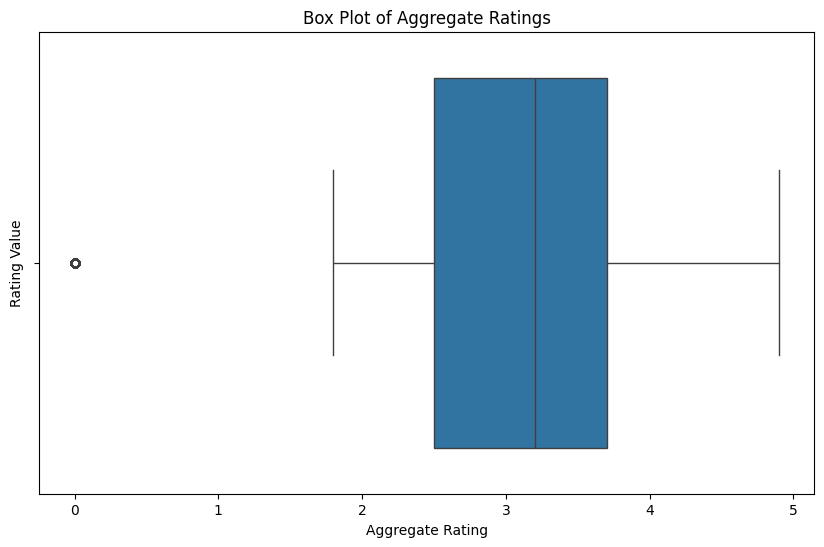

In [ ]:
# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(cognifyz_data['Aggregate rating'], bins=20, kde=True)
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

# Bar plot
plt.figure(figsize=(10, 6))
sns.countplot(x=cognifyz_data['Aggregate rating'])
plt.title('Count of Restaurants by Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.show()

# Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x=cognifyz_data['Aggregate rating'])
plt.title('Box Plot of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Rating Value')
plt.show()

**Explanation:**

**Histogram**: Visualizes the frequency distribution of ratings, showing how many restaurants fall within each rating range.

**Bar Plot:** Displays the count of restaurants for each rating category.

**Box Plot:** Illustrates the distribution of ratings, including median, quartiles, and outliers.

**Interpretation:**

**Interpreting the Histogram of Aggregate Ratings**

**Overview**

The histogram presents the distribution of aggregate ratings for a dataset. It shows the frequency of different rating values, providing insights into the overall rating patterns.

**Key Observations:**

**Skewness:** The distribution is slightly right-skewed, indicating that there are a few restaurants with very high ratings, while the majority of restaurants have ratings closer to the average.

**Mode**: The most frequent rating appears to be around 4.0.

**Range:** The ratings range from approximately 0 to 5, with a concentration between 3 and 4.

**Density Curve**: The overlaid density curve suggests an underlying normal distribution with some right-skewness.

**Interpreting the Second Histogram**

**Overview**

The second histogram, while similar to the first, shows a slight shift in the distribution of aggregate ratings. The peak has moved towards the lower end, and the overall distribution appears slightly more spread out.

**Key Observations:**

**Mode Shift**: The most frequent rating has shifted slightly towards the lower end compared to the first histogram.

**Spread:** The distribution is slightly wider, indicating greater variability in ratings.

**Skewness**: The right-skewness has decreased, suggesting a more balanced distribution.

**Possible Explanations:**

**Changes in Restaurant Quality**: The shift in the mode might indicate a change in the overall quality of restaurants.

**Changes in Customer Preferences:** Shifts in customer preferences or expectations could lead to different rating patterns.

**Data Updates**: If the dataset has been updated with newer data, it could affect the distribution.

**Understanding the Box Plot:**

A box plot, provides a visual representation of the distribution of a dataset. It shows the median, quartiles, and potential outliers.

**Interpretation of the Box Plot:**

Based on the provided box plot, we can observe the following:

**Central Tendency**: The median rating appears to be around 3.5, indicating that 50% of the restaurants have received ratings above this value.

**Spread:** The box is relatively short, suggesting a moderate spread in ratings.

**Outliers:** There is a single outlier on the lower end of the distribution, indicating a restaurant with a significantly lower rating compared to the rest.

**Symmetry**: The box plot is slightly skewed to the right, indicating a slight concentration of higher rating

**Overall,** the box plot suggests that most restaurants receive ratings between 3 and 4, with a general trend towards higher ratings.